In [1]:
import pickle
from helper_fxns import convert_param_vec_dict_to_param_dict, gelman_rubin_trace_dict, print_convergence_summary, sample_plots, create_trace_matrix, plot_histograms
from earm.lopez_embedded import model
%matplotlib inline
import os
import numpy as np
from corner import corner
import matplotlib.pyplot as plt
import seaborn as sns

/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)
/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/utils/traitlets.py:5: UserWarning: IPython.utils.traitlets has moved to a top-level traitlets package.
  warn("IPython.utils.traitlets has moved to a top-level traitlets package.")


In [2]:
os.chdir('/Users/Erin/git/accre_data_analysis/uniform_priors_.25his/')

In [3]:
traces = {}
for trace in ['a', 'b', 'c', 'd']:
    traces[trace] = [np.load('earm_dreamz_5chain_uniform_.25his_'+str(trace)+'_sampled_params_chain_0.npy')]
    for chain in range(1, 5):
        traces[trace].append(np.load('earm_dreamz_5chain_uniform_.25his_'+str(trace)+'_sampled_params_chain_'+str(chain)+'.npy'))

In [4]:
logps = {}
for trace in ['a', 'b', 'c', 'd']:
    logps[trace] = [np.load('earm_dreamz_5chain_uniform_.25his_'+str(trace)+'_logps_chain_0.npy')]
    print 'Logp of trace: ',trace,' chain: 0 = ',logps[trace][-1]
    for chain in range(1, 5):
        logps[trace].append(np.load('earm_dreamz_5chain_uniform_.25his_'+str(trace)+'_logps_chain_'+str(chain)+'.npy'))
        print 'Logp of trace: ',trace,' chain: ',chain,' = ',logps[trace][-1][-1]

Logp of trace:  a  chain: 0 =  [[-1567.76576178]
 [-1072.31566524]
 [-1072.31566524]
 ..., 
 [  104.5086616 ]
 [  104.5086616 ]
 [  104.5086616 ]]
Logp of trace:  a  chain:  1  =  [ 107.45598533]
Logp of trace:  a  chain:  2  =  [ 105.24157419]
Logp of trace:  a  chain:  3  =  [ 103.77647229]
Logp of trace:  a  chain:  4  =  [ 106.11592086]
Logp of trace:  b  chain: 0 =  [[-3102.26868961]
 [-3102.26868961]
 [-3082.17079228]
 ..., 
 [  105.4259767 ]
 [  105.4259767 ]
 [  105.4259767 ]]
Logp of trace:  b  chain:  1  =  [ 106.9345182]
Logp of trace:  b  chain:  2  =  [ 105.83760026]
Logp of trace:  b  chain:  3  =  [ 105.44252019]
Logp of trace:  b  chain:  4  =  [ 107.36939968]
Logp of trace:  c  chain: 0 =  [[-2531.44999082]
 [-2499.78622621]
 [-2434.27625748]
 ..., 
 [  106.83506345]
 [  106.83506345]
 [  106.83506345]]
Logp of trace:  c  chain:  1  =  [ 107.16988102]
Logp of trace:  c  chain:  2  =  [ 105.53937393]
Logp of trace:  c  chain:  3  =  [ 105.64496925]
Logp of trace:  c  ch

In [5]:
traces['a'][0][:,72]

array([-1.40669329, -1.38667143, -1.38667143, ..., -2.58618457,
       -2.58618457, -2.58618457])

In [6]:
param_trace_dicts = {}
param_trace_dict_a = {}
gelman_rubin_dicts = {}
param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]
for run in ['a', 'b', 'c', 'd']:
    for i, param in enumerate(model.parameters_rules()):
        param_trace_dict_a[param.name] = [traces[run][chain][:,i] for chain in range(len(traces[run]))]
    param_trace_dicts[run] = param_trace_dict_a
    gelman_rubin_dicts[run] = gelman_rubin_trace_dict(param_trace_dict_a)
    param_trace_dict_a = {}
    param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]

In [7]:
print_convergence_summary(param_trace_dicts['a'])

Number of parameters with GR below 1.2:  62  of  105  parameters.
Percent of parameters with GR below 1.2:  59.0476190476
Number of parameters with GR below 1.1:  37  of  105  parameters.
Percent of parameters with GR below 1.1:  35.2380952381


[62, 59.04761904761905, 37, 35.23809523809524]

In [8]:
print_convergence_summary(param_trace_dicts['b'])

Number of parameters with GR below 1.2:  78  of  105  parameters.
Percent of parameters with GR below 1.2:  74.2857142857
Number of parameters with GR below 1.1:  32  of  105  parameters.
Percent of parameters with GR below 1.1:  30.4761904762


[78, 74.28571428571429, 32, 30.476190476190478]

In [9]:
print_convergence_summary(param_trace_dicts['c'])

Number of parameters with GR below 1.2:  37  of  105  parameters.
Percent of parameters with GR below 1.2:  35.2380952381
Number of parameters with GR below 1.1:  11  of  105  parameters.
Percent of parameters with GR below 1.1:  10.4761904762


[37, 35.23809523809524, 11, 10.476190476190476]

In [10]:
print_convergence_summary(param_trace_dicts['d'])

Number of parameters with GR below 1.2:  43  of  105  parameters.
Percent of parameters with GR below 1.2:  40.9523809524
Number of parameters with GR below 1.1:  8  of  105  parameters.
Percent of parameters with GR below 1.1:  7.61904761905


[43, 40.95238095238095, 8, 7.6190476190476195]

50000
5
50000


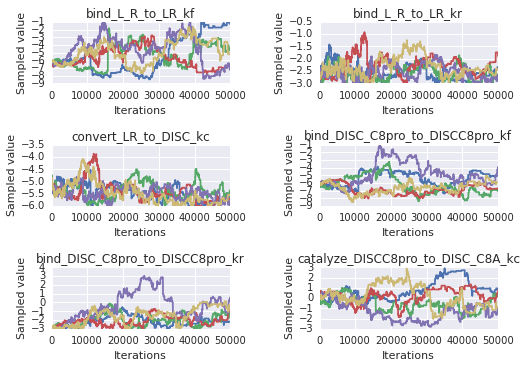

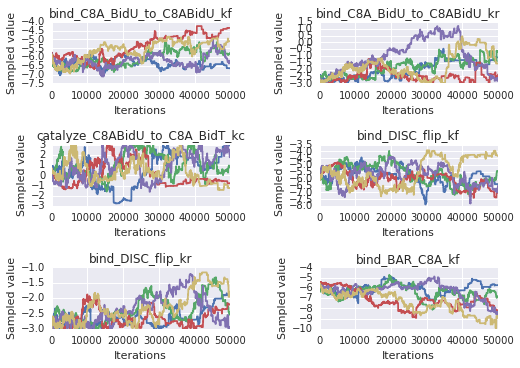

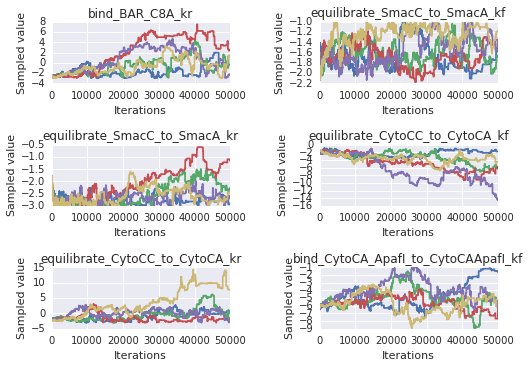

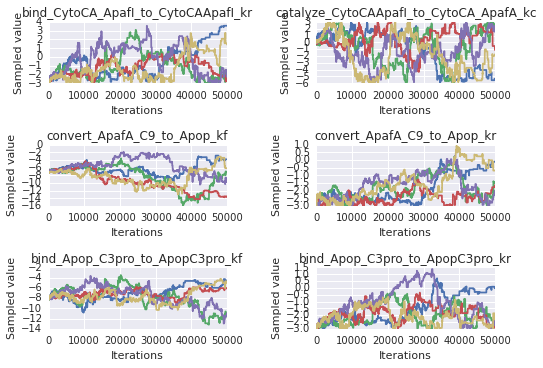

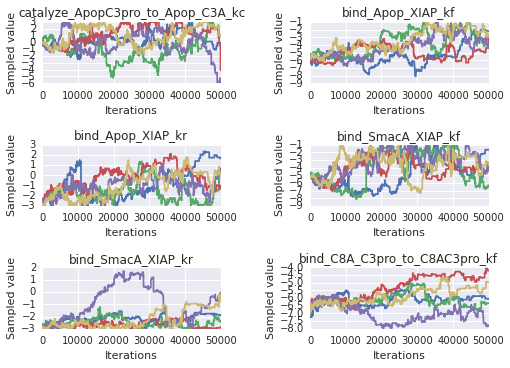

...

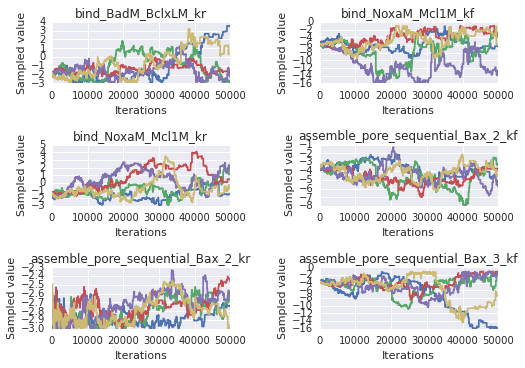

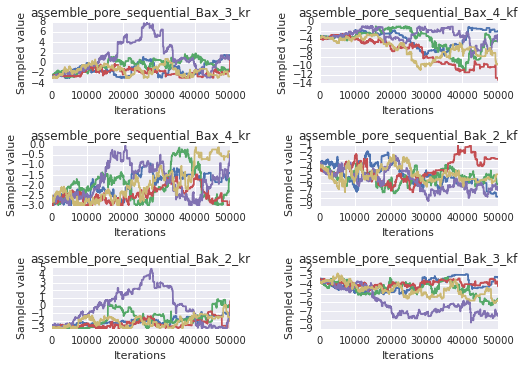

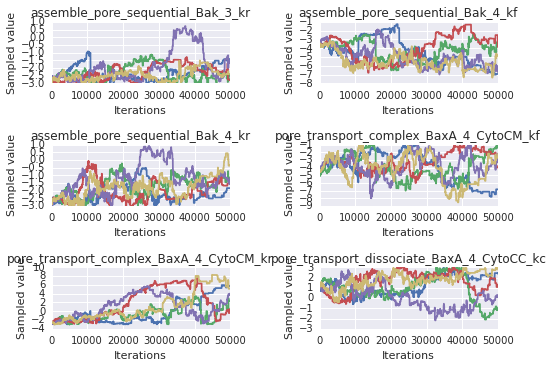

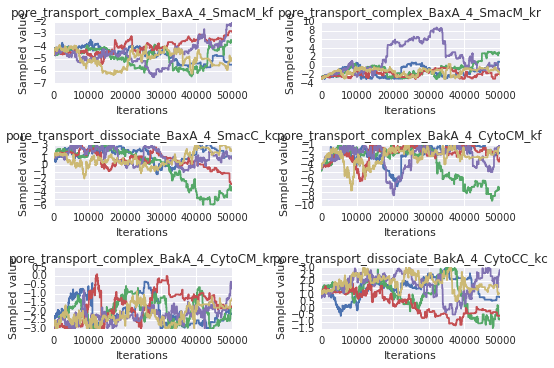

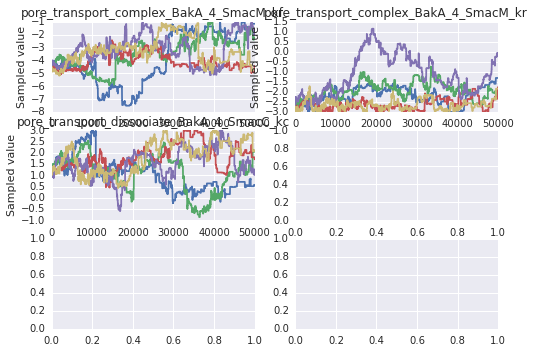

In [11]:
sample_plots(param_trace_dicts['a'])

In [12]:
trace_arr_a = create_trace_matrix(param_trace_dicts['a'], burnin=10000, thin=1)
trace_arr_b = create_trace_matrix(param_trace_dicts['b'], burnin=10000, thin=1)
trace_arr_c = create_trace_matrix(param_trace_dicts['c'], burnin=10000, thin=1)
trace_arr_d = create_trace_matrix(param_trace_dicts['d'], burnin=10000, thin=1)

/System/Library/Frameworks/Python.framework/Versions/2.7/Extras/lib/python/matplotlib/pyplot.py:412: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_num_figures`).
  max_open_warning, RuntimeWarning)


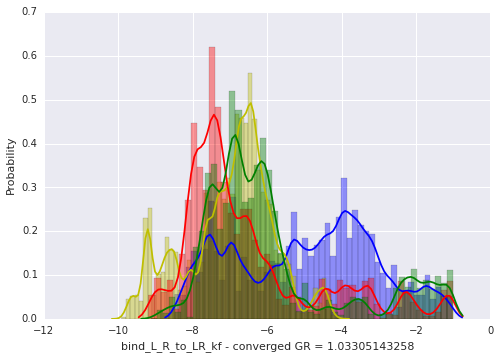

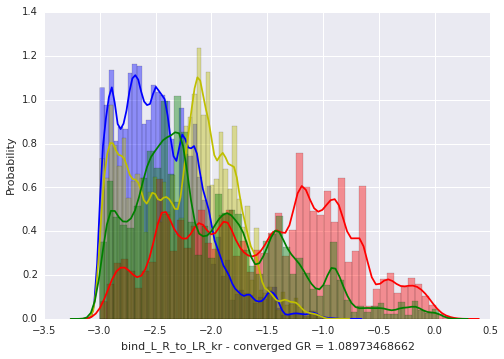

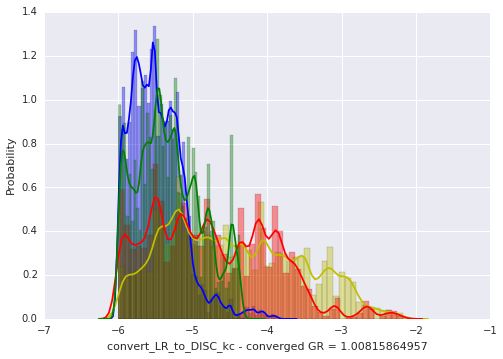

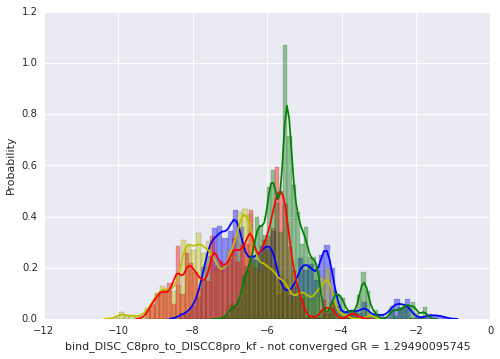

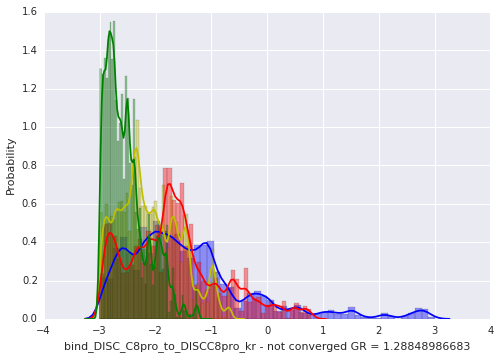

...

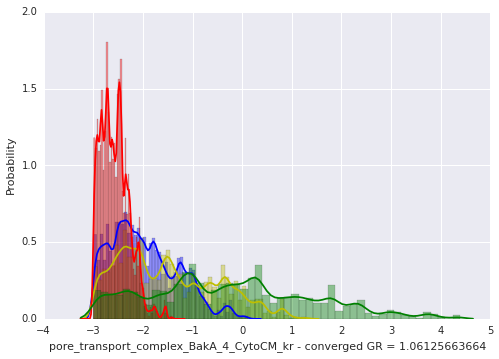

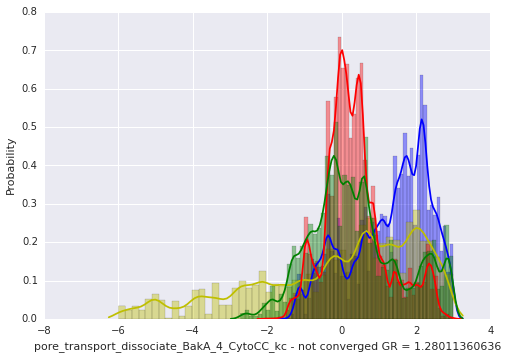

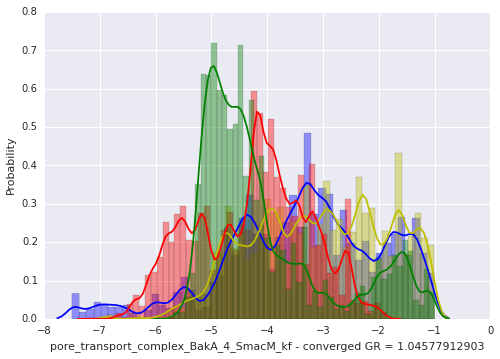

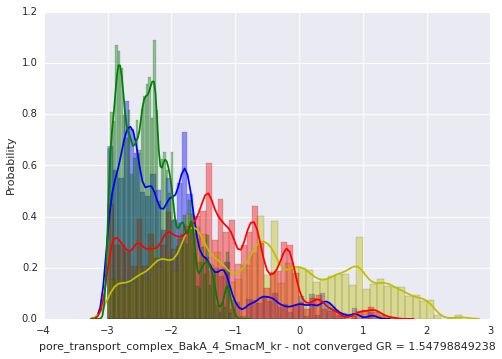

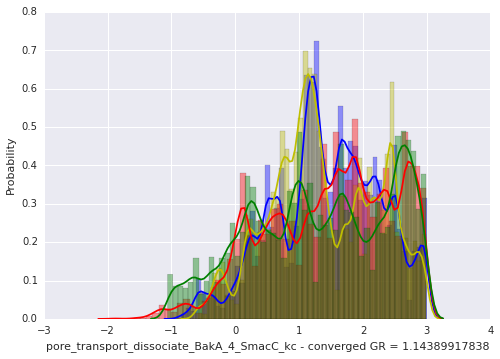

In [13]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    sns.plotting_context('notebook')
    ax = sns.distplot(trace_arr_a[:,dim], hist=True, color='b')
    sns.distplot(trace_arr_b[:,dim], hist=True, color='y')
    sns.distplot(trace_arr_c[:,dim], hist=True, color='r')
    sns.distplot(trace_arr_d[:,dim], hist=True, color='g')
    if gelman_rubin_dicts['a'][param_name] < 1.2:
        sns.axlabel(param_name+' - converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')
    else:
        sns.axlabel(param_name+' - not converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')

In [14]:
traces['a'][1][:,0]

array([-6.33374092, -6.33374092, -6.38922234, ..., -4.60554295,
       -4.60554295, -4.60554295])

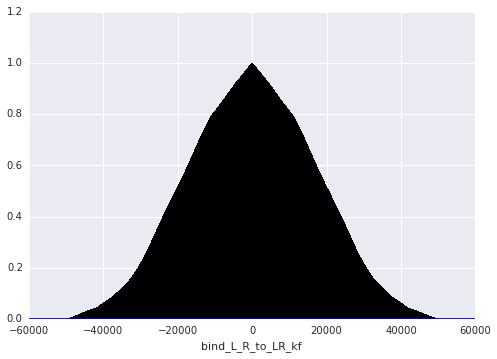

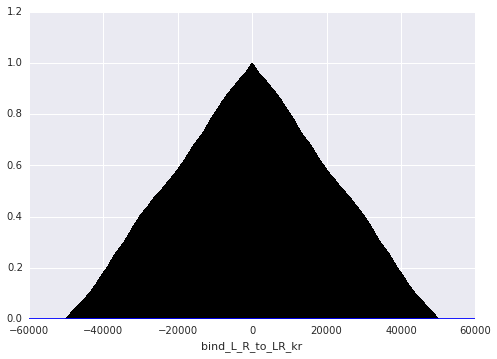

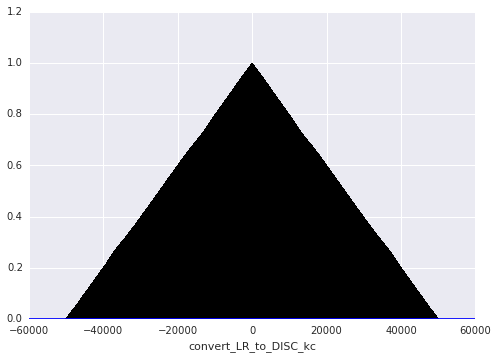

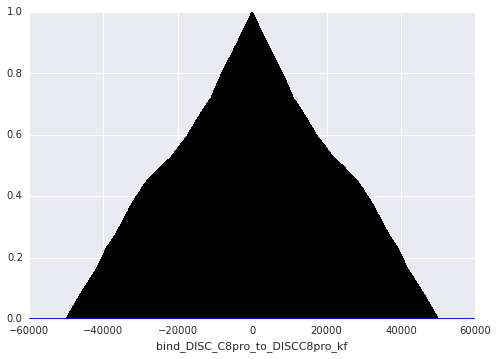

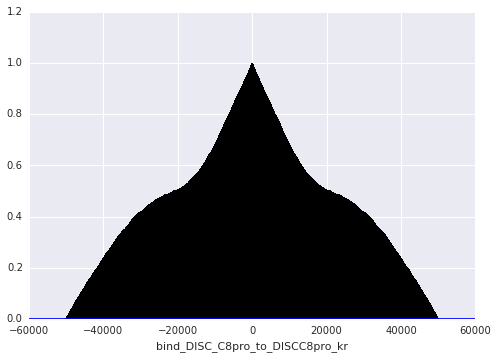

...

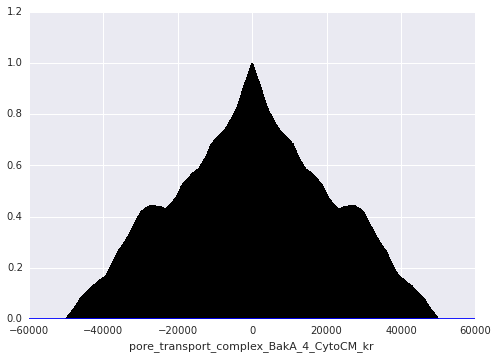

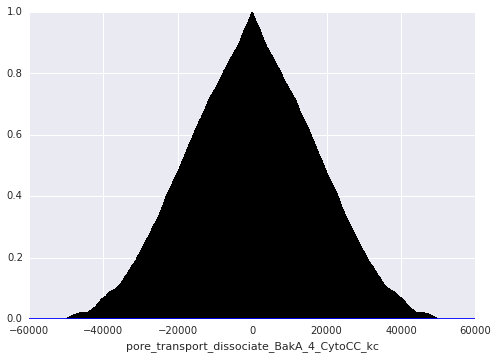

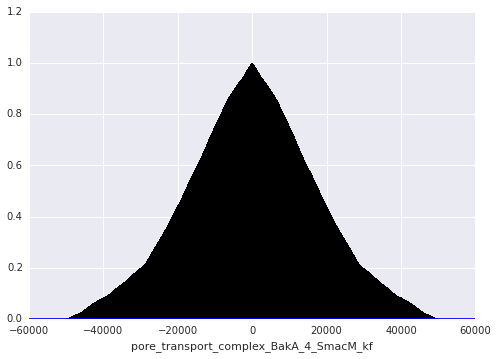

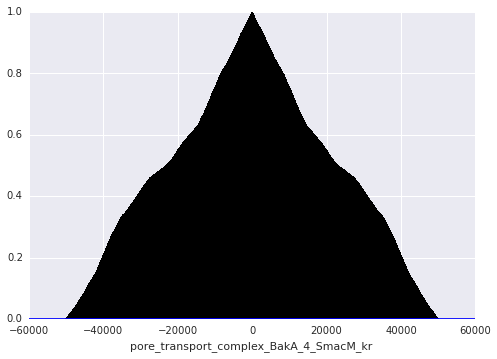

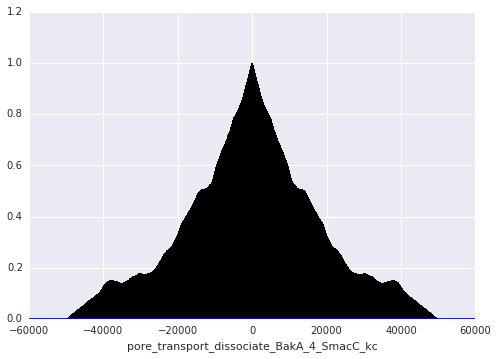

In [20]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][0][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

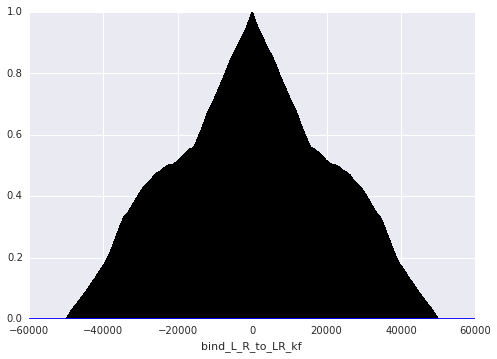

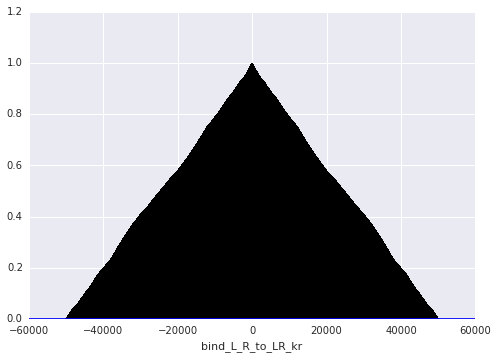

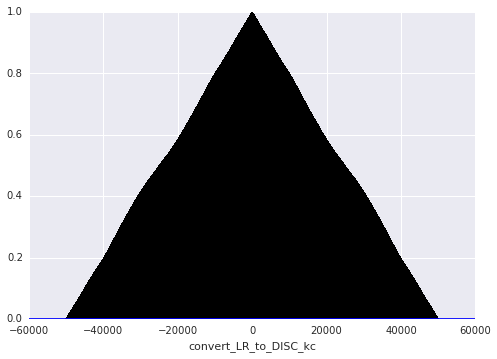

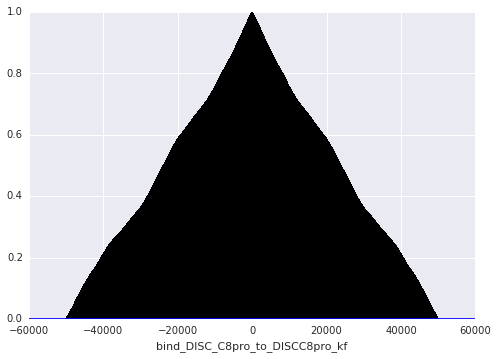

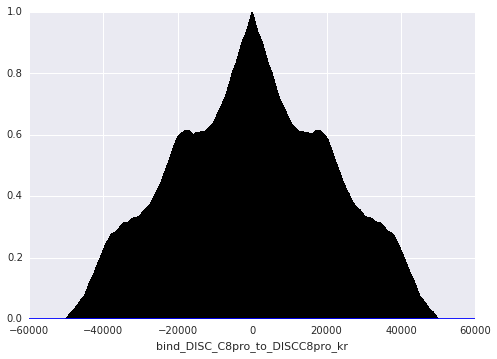

...

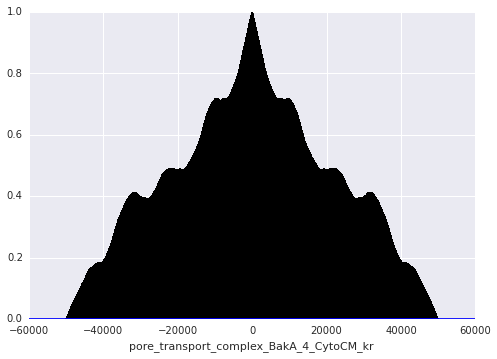

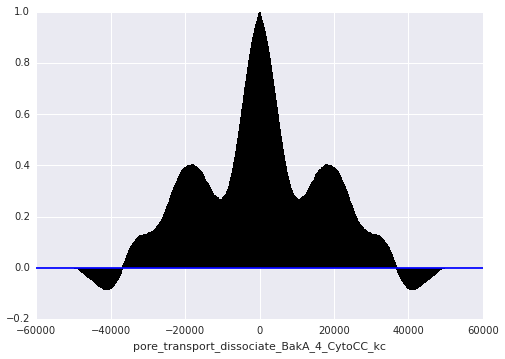

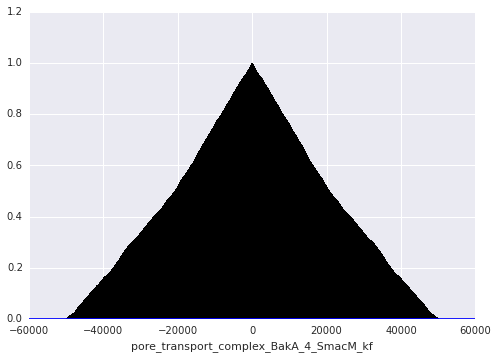

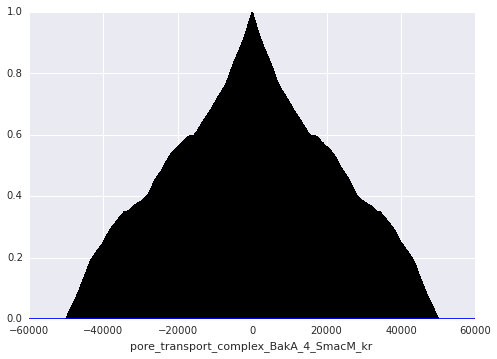

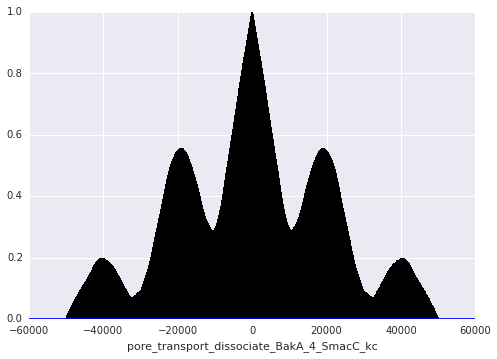

In [21]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][1][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

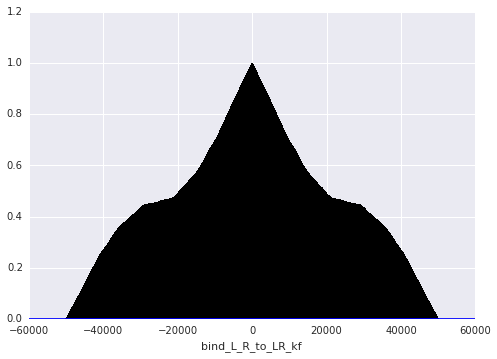

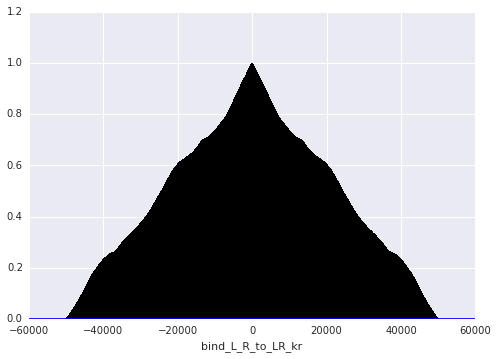

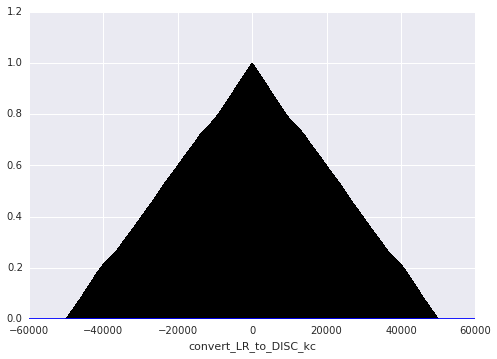

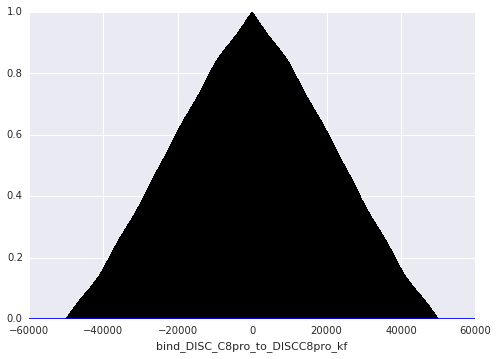

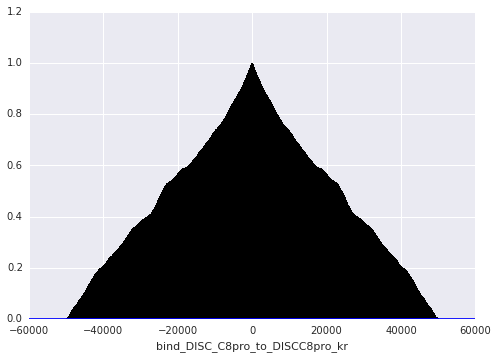

...

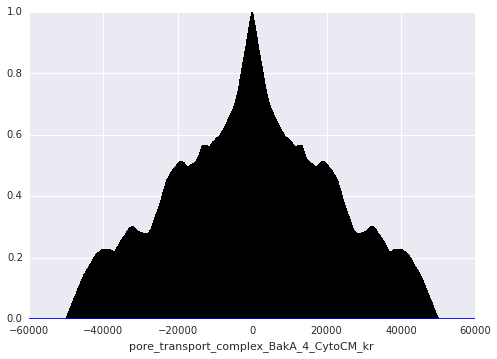

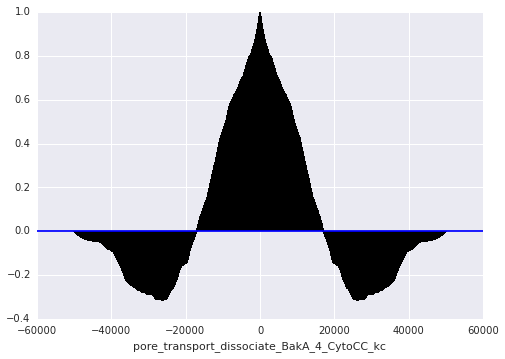

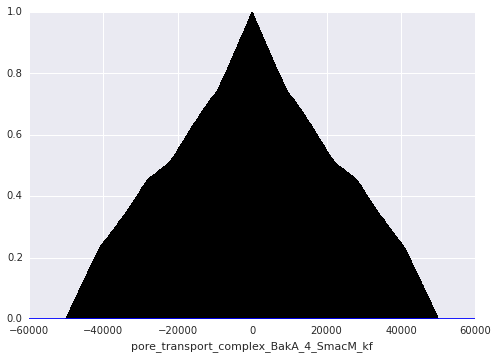

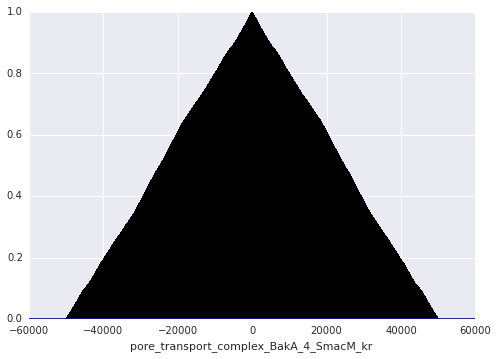

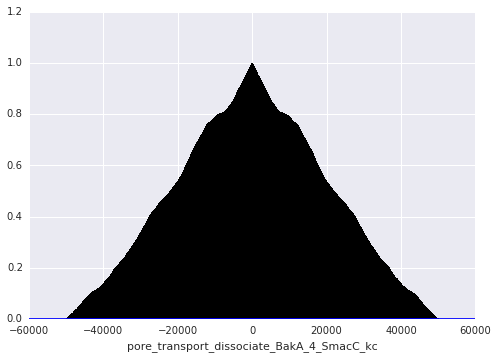

In [22]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][2][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

In [ ]:
corner(trace_arr_a[:,50:60:], labels=param_trace_dict_a['param_list'][50:60], bins=10)

In [15]:
acceptance_rates = np.zeros((len(traces['a'][0][0],)))
for dim in range(len(traces['a'][0][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][0])):
        if traces['a'][0][iteration][dim] != traces['a'][0][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  838  acceptance rate:  0.01676
N acceptances for parameter:  bind_L_R_to_LR_kr  =  866  acceptance rate:  0.01732
N acceptances for parameter:  convert_LR_to_DISC_kc  =  839  acceptance rate:  0.01678
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  818  acceptance rate:  0.01636
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  873  acceptance rate:  0.01746
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  852  acceptance rate:  0.01704
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  839  acceptance rate:  0.01678
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  888  acceptance rate:  0.01776
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  867  acceptance rate:  0.01734
N acceptances for parameter:  bind_DISC_flip_kf  =  890  acceptance rate:  0.0178
N acceptances for parameter:  bind_DISC_flip_kr  =  857  acceptance rate:  0.01714
N acce

array([ 0.01676,  0.01732,  0.01678,  0.01636,  0.01746,  0.01704,
        0.01678,  0.01776,  0.01734,  0.0178 ,  0.01714,  0.01742,
        0.0178 ,  0.01692,  0.0173 ,  0.0173 ,  0.01734,  0.01764,
        0.01674,  0.01766,  0.01694,  0.0174 ,  0.01742,  0.01732,
        0.01676,  0.01744,  0.01728,  0.01676,  0.01762,  0.01666,
        0.01762,  0.01736,  0.01666,  0.0177 ,  0.01716,  0.01674,
        0.01738,  0.0172 ,  0.0166 ,  0.01766,  0.0172 ,  0.01714,
        0.01722,  0.01696,  0.0171 ,  0.01744,  0.0173 ,  0.01738,
        0.01716,  0.01748,  0.01724,  0.01722,  0.01656,  0.01724,
        0.0168 ,  0.01706,  0.01766,  0.01688,  0.01718,  0.01764,
        0.0169 ,  0.01676,  0.0175 ,  0.01736,  0.01688,  0.01714,
        0.01722,  0.0175 ,  0.0172 ,  0.01702,  0.0177 ,  0.0176 ,
        0.01722,  0.01706,  0.01716,  0.0166 ,  0.01716,  0.01752,
        0.0175 ,  0.01714,  0.01726,  0.01746,  0.01686,  0.0171 ,
        0.01744,  0.01724,  0.0171 ,  0.01746,  0.01758,  0.01

In [16]:
acceptance_rates = np.zeros((len(traces['a'][1][0],)))
for dim in range(len(traces['a'][1][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][1])):
        if traces['a'][1][iteration][dim] != traces['a'][1][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][1])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  898  acceptance rate:  0.01796
N acceptances for parameter:  bind_L_R_to_LR_kr  =  917  acceptance rate:  0.01834
N acceptances for parameter:  convert_LR_to_DISC_kc  =  902  acceptance rate:  0.01804
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  906  acceptance rate:  0.01812
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  955  acceptance rate:  0.0191
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  923  acceptance rate:  0.01846
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  883  acceptance rate:  0.01766
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  946  acceptance rate:  0.01892
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  958  acceptance rate:  0.01916
N acceptances for parameter:  bind_DISC_flip_kf  =  941  acceptance rate:  0.01882
N acceptances for parameter:  bind_DISC_flip_kr  =  926  acceptance rate:  0.01852
N acce

array([ 0.01796,  0.01834,  0.01804,  0.01812,  0.0191 ,  0.01846,
        0.01766,  0.01892,  0.01916,  0.01882,  0.01852,  0.0184 ,
        0.01886,  0.01904,  0.0188 ,  0.01902,  0.01862,  0.0191 ,
        0.01872,  0.0193 ,  0.01932,  0.01858,  0.01882,  0.01918,
        0.01852,  0.01844,  0.01872,  0.01888,  0.0196 ,  0.018  ,
        0.01904,  0.01832,  0.01798,  0.01888,  0.01904,  0.01864,
        0.01854,  0.01892,  0.018  ,  0.01848,  0.01916,  0.01834,
        0.01874,  0.019  ,  0.01926,  0.01908,  0.01864,  0.01872,
        0.01924,  0.01842,  0.01912,  0.0193 ,  0.01826,  0.01894,
        0.01876,  0.0189 ,  0.01898,  0.01884,  0.01896,  0.01888,
        0.01862,  0.019  ,  0.01884,  0.01844,  0.01858,  0.01872,
        0.01912,  0.01872,  0.01858,  0.01886,  0.0187 ,  0.01892,
        0.01886,  0.01852,  0.01894,  0.01878,  0.01886,  0.01856,
        0.01882,  0.01898,  0.0185 ,  0.01898,  0.01858,  0.01912,
        0.01896,  0.01892,  0.01914,  0.01894,  0.0193 ,  0.01

In [17]:
acceptance_rates = np.zeros((len(traces['a'][2][0],)))
for dim in range(len(traces['a'][2][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][2])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][2])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  827  acceptance rate:  0.01654
N acceptances for parameter:  bind_L_R_to_LR_kr  =  838  acceptance rate:  0.01676
N acceptances for parameter:  convert_LR_to_DISC_kc  =  819  acceptance rate:  0.01638
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  802  acceptance rate:  0.01604
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  821  acceptance rate:  0.01642
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  864  acceptance rate:  0.01728
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  838  acceptance rate:  0.01676
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  846  acceptance rate:  0.01692
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  809  acceptance rate:  0.01618
N acceptances for parameter:  bind_DISC_flip_kf  =  854  acceptance rate:  0.01708
N acceptances for parameter:  bind_DISC_flip_kr  =  858  acceptance rate:  0.01716
N acc

array([ 0.01654,  0.01676,  0.01638,  0.01604,  0.01642,  0.01728,
        0.01676,  0.01692,  0.01618,  0.01708,  0.01716,  0.0165 ,
        0.01714,  0.01666,  0.0168 ,  0.01696,  0.01702,  0.0167 ,
        0.0166 ,  0.01738,  0.01652,  0.01712,  0.0167 ,  0.01684,
        0.01702,  0.01654,  0.0173 ,  0.01634,  0.01646,  0.01652,
        0.01706,  0.01666,  0.01598,  0.01712,  0.01684,  0.01656,
        0.01694,  0.01654,  0.01652,  0.01688,  0.0169 ,  0.01646,
        0.0171 ,  0.01658,  0.01666,  0.0168 ,  0.01676,  0.01708,
        0.01672,  0.017  ,  0.01678,  0.01676,  0.01632,  0.01732,
        0.01698,  0.017  ,  0.01702,  0.01668,  0.017  ,  0.01682,
        0.0173 ,  0.0168 ,  0.01684,  0.0168 ,  0.01674,  0.01698,
        0.01706,  0.01714,  0.01658,  0.0168 ,  0.01716,  0.0169 ,
        0.01706,  0.01654,  0.01706,  0.01686,  0.01664,  0.01656,
        0.01668,  0.01728,  0.017  ,  0.01702,  0.01722,  0.0169 ,
        0.01682,  0.01666,  0.01668,  0.017  ,  0.01682,  0.01

In [18]:
acceptance_rates = np.zeros((len(traces['b'][3][0],)))
for dim in range(len(traces['a'][2][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['b'][0])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['b'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  827  acceptance rate:  0.01654
N acceptances for parameter:  bind_L_R_to_LR_kr  =  838  acceptance rate:  0.01676
N acceptances for parameter:  convert_LR_to_DISC_kc  =  819  acceptance rate:  0.01638
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  802  acceptance rate:  0.01604
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  821  acceptance rate:  0.01642
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  864  acceptance rate:  0.01728
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  838  acceptance rate:  0.01676
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  846  acceptance rate:  0.01692
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  809  acceptance rate:  0.01618
N acceptances for parameter:  bind_DISC_flip_kf  =  854  acceptance rate:  0.01708
N acceptances for parameter:  bind_DISC_flip_kr  =  858  acceptance rate:  0.01716
N acc

array([ 0.01654,  0.01676,  0.01638,  0.01604,  0.01642,  0.01728,
        0.01676,  0.01692,  0.01618,  0.01708,  0.01716,  0.0165 ,
        0.01714,  0.01666,  0.0168 ,  0.01696,  0.01702,  0.0167 ,
        0.0166 ,  0.01738,  0.01652,  0.01712,  0.0167 ,  0.01684,
        0.01702,  0.01654,  0.0173 ,  0.01634,  0.01646,  0.01652,
        0.01706,  0.01666,  0.01598,  0.01712,  0.01684,  0.01656,
        0.01694,  0.01654,  0.01652,  0.01688,  0.0169 ,  0.01646,
        0.0171 ,  0.01658,  0.01666,  0.0168 ,  0.01676,  0.01708,
        0.01672,  0.017  ,  0.01678,  0.01676,  0.01632,  0.01732,
        0.01698,  0.017  ,  0.01702,  0.01668,  0.017  ,  0.01682,
        0.0173 ,  0.0168 ,  0.01684,  0.0168 ,  0.01674,  0.01698,
        0.01706,  0.01714,  0.01658,  0.0168 ,  0.01716,  0.0169 ,
        0.01706,  0.01654,  0.01706,  0.01686,  0.01664,  0.01656,
        0.01668,  0.01728,  0.017  ,  0.01702,  0.01722,  0.0169 ,
        0.01682,  0.01666,  0.01668,  0.017  ,  0.01682,  0.01

In [19]:
acceptance_rates = np.zeros((len(traces['b'][4][0],)))
for dim in range(len(traces['a'][2][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['b'][0])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['b'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  827  acceptance rate:  0.01654
N acceptances for parameter:  bind_L_R_to_LR_kr  =  838  acceptance rate:  0.01676
N acceptances for parameter:  convert_LR_to_DISC_kc  =  819  acceptance rate:  0.01638
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  802  acceptance rate:  0.01604
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  821  acceptance rate:  0.01642
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  864  acceptance rate:  0.01728
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  838  acceptance rate:  0.01676
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  846  acceptance rate:  0.01692
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  809  acceptance rate:  0.01618
N acceptances for parameter:  bind_DISC_flip_kf  =  854  acceptance rate:  0.01708
N acceptances for parameter:  bind_DISC_flip_kr  =  858  acceptance rate:  0.01716
N acc

array([ 0.01654,  0.01676,  0.01638,  0.01604,  0.01642,  0.01728,
        0.01676,  0.01692,  0.01618,  0.01708,  0.01716,  0.0165 ,
        0.01714,  0.01666,  0.0168 ,  0.01696,  0.01702,  0.0167 ,
        0.0166 ,  0.01738,  0.01652,  0.01712,  0.0167 ,  0.01684,
        0.01702,  0.01654,  0.0173 ,  0.01634,  0.01646,  0.01652,
        0.01706,  0.01666,  0.01598,  0.01712,  0.01684,  0.01656,
        0.01694,  0.01654,  0.01652,  0.01688,  0.0169 ,  0.01646,
        0.0171 ,  0.01658,  0.01666,  0.0168 ,  0.01676,  0.01708,
        0.01672,  0.017  ,  0.01678,  0.01676,  0.01632,  0.01732,
        0.01698,  0.017  ,  0.01702,  0.01668,  0.017  ,  0.01682,
        0.0173 ,  0.0168 ,  0.01684,  0.0168 ,  0.01674,  0.01698,
        0.01706,  0.01714,  0.01658,  0.0168 ,  0.01716,  0.0169 ,
        0.01706,  0.01654,  0.01706,  0.01686,  0.01664,  0.01656,
        0.01668,  0.01728,  0.017  ,  0.01702,  0.01722,  0.0169 ,
        0.01682,  0.01666,  0.01668,  0.017  ,  0.01682,  0.01